In [1]:
import pandas as pd

In [2]:
from utils import downloadData,extract_file,to_dataframe
from ml_tool import assess_NA,smooth,feature_importance
from ml_algorithms import SVM_Grid_search,SVM_Cross_val,ANN_grid_search

2023-05-25 00:14:35.308895: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-25 00:14:36.127410: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load li

# Preprocesing on VFDB

In [3]:

file_name_vfdb=extract_file("vfdb database","database//vfdb")



vfdb database : 22


Processing files vfdb


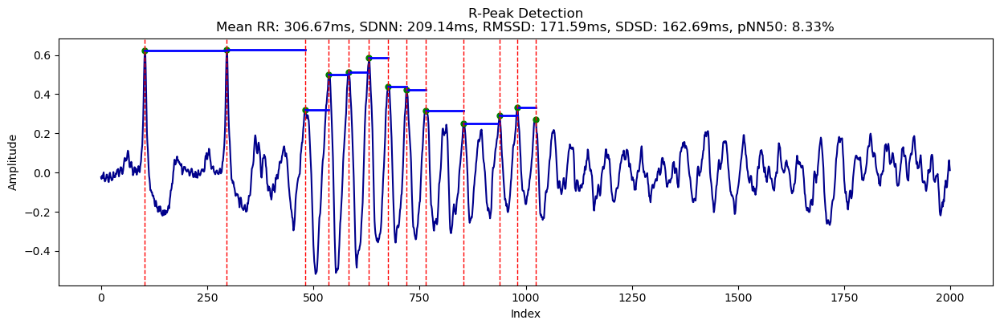

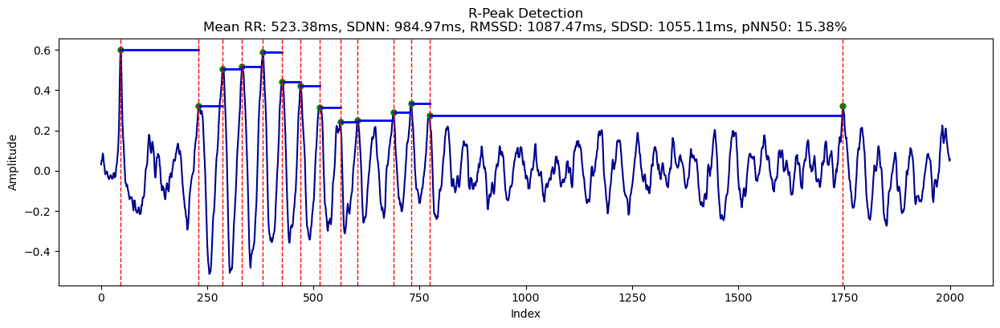

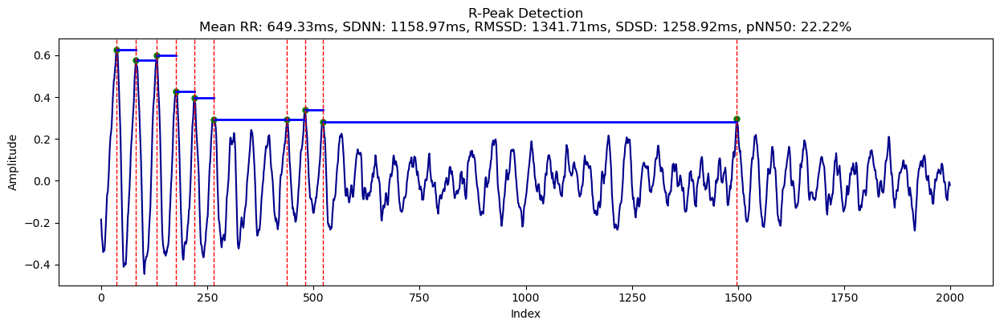

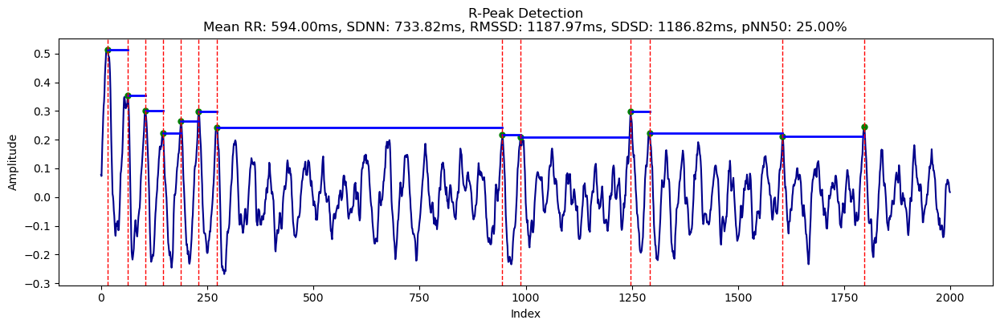

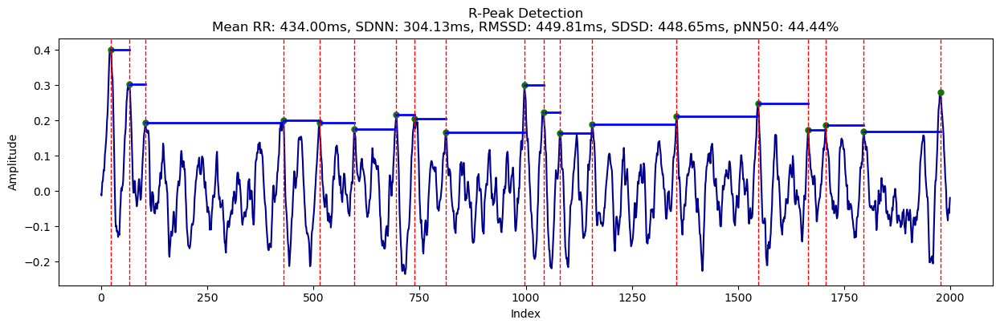

...

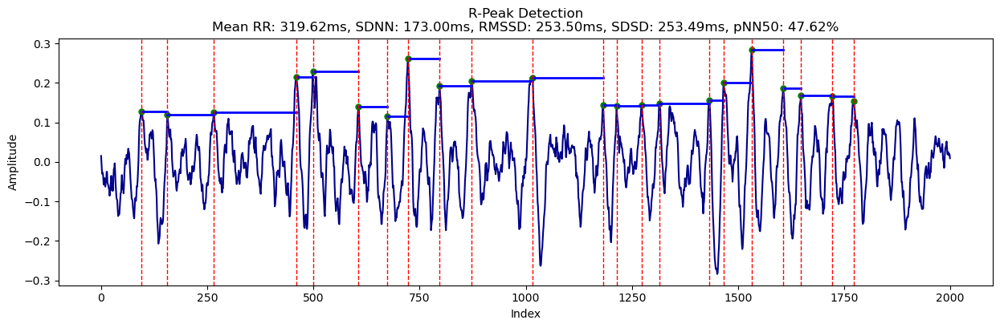

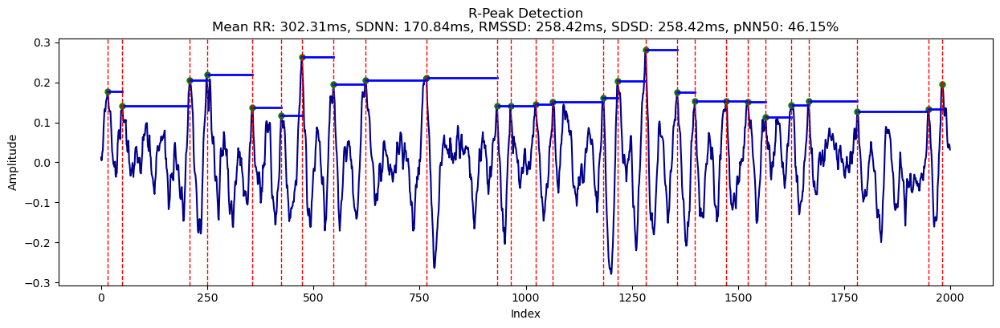

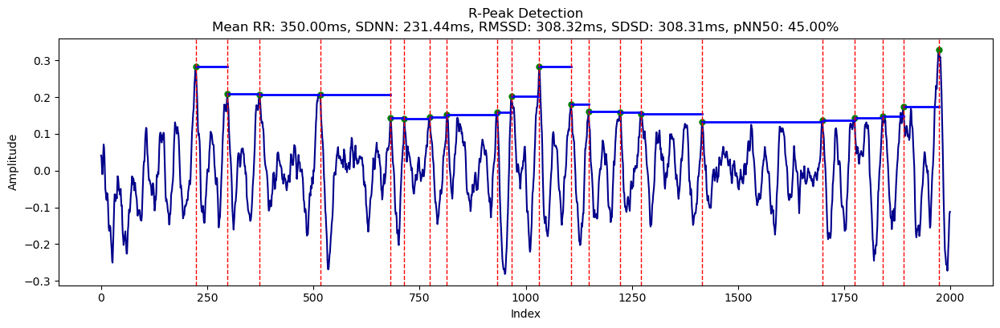

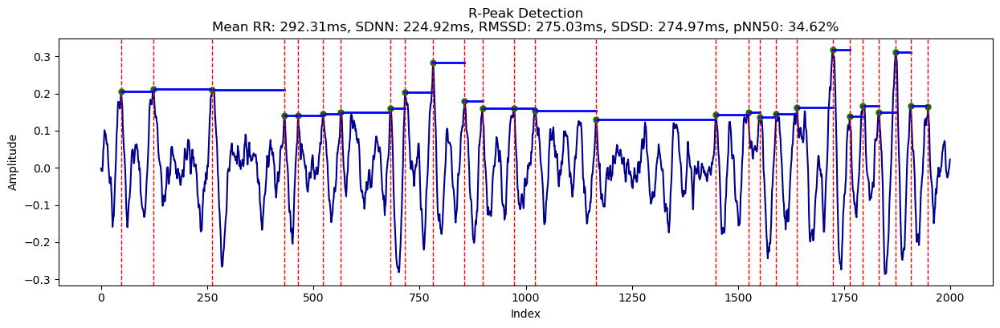

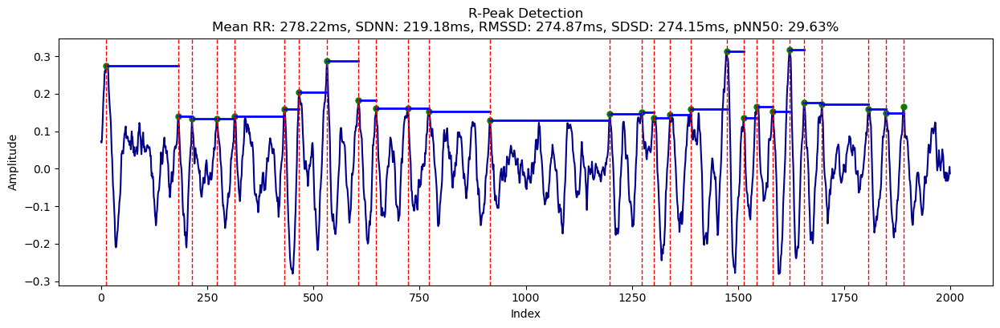

KeyboardInterrupt: 

In [4]:
df_c1=to_dataframe(8,"vfdb",file_name_vfdb,1)


In [4]:
df_c2=to_dataframe(8,"vfdb",file_name_vfdb,2)


Processing files vfdb


In [7]:
df_c1 = pd.read_excel("vfdb_c1N.xlsx")

FileNotFoundError: [Errno 2] No such file or directory: 'vfdb_c1N.xlsx'

In [4]:
df_c2 = pd.read_excel("vfdb_c2N.xlsx")

df = pd.concat([df_c1, df_c2], axis=0)


In [5]:
df_c3 = pd.read_excel("cudb_cc1N.xlsx")

In [6]:
df = pd.concat([df, df_c3], axis=0)

In [ ]:
df_c1.columns

In [ ]:
df_c2.columns

# Preproccesing on CUDB

In [ ]:

file_name_cudb=extract_file("cudb database","database//cudb")
df_Cc1=to_dataframe(8,"cudb",file_name_cudb,1)
df_Cc1.to_excel("cudb_cc1N.xlsx")

df_Cc2=to_dataframe(8,"cudb",file_name_cudb,2)
df_Cc2.to_excel("cudb_cc1N.xlsx")

# Data Statitic 

In [9]:
df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 97571 entries, 0 to 17534
Data columns (total 26 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  97571 non-null  int64  
 1   label       97571 non-null  object 
 2   signal      97571 non-null  object 
 3   channel     97571 non-null  object 
 4   db          97571 non-null  object 
 5   fs          97571 non-null  int64  
 6   RDAmpM      97571 non-null  float64
 7   RDAmpSD     97571 non-null  float64
 8   QRsa        97571 non-null  float64
 9   QRaSD       97571 non-null  float64
 10  S           97571 non-null  object 
 11  Q           97571 non-null  object 
 12  R           97571 non-null  object 
 13  mean_rr     94731 non-null  float64
 14  std_rr      94731 non-null  float64
 15  rmssd       93353 non-null  float64
 16  sdnn        94731 non-null  float64
 17  lf_power    97571 non-null  float64
 18  hf_power    97571 non-null  float64
 19  lfhf_ratio  96030 non-nul

In [10]:
df_stat=assess_NA(df)

In [10]:
import pandas as pd

def supprimer_lignes_na(df):
    """
    Supprime les lignes du dataframe où il y a des valeurs manquantes (N/A).
    
    Args:
        df (pandas.DataFrame): Le dataframe Pandas à nettoyer.
    
    Returns:
        pandas.DataFrame: Le dataframe nettoyé.
    """
    return df.dropna(axis=0, how='any')

In [11]:
df=supprimer_lignes_na(df)

In [ ]:
df.columns

In [11]:
print(df_stat)

Empty DataFrame
Columns: [Number of NA, Percent NA]
Index: []


In [12]:
print(df[df["label"] == "NotVF"].count())

Unnamed: 0    85857
label         85857
signal        85857
channel       85857
db            85857
fs            85857
RDAmpM        85857
RDAmpSD       85857
QRsa          85857
QRaSD         85857
S             85857
Q             85857
R             85857
mean_rr       85857
std_rr        85857
rmssd         85857
sdnn          85857
lf_power      85857
hf_power      85857
lfhf_ratio    85857
pos_area      85857
neg_area      85857
vlf_power     85857
ulf_power     85857
lfnu          85857
hfnu          85857
dtype: int64


In [13]:
print(df[df["label"] == "VF"].count())

Unnamed: 0    7462
label         7462
signal        7462
channel       7462
db            7462
fs            7462
RDAmpM        7462
RDAmpSD       7462
QRsa          7462
QRaSD         7462
S             7462
Q             7462
R             7462
mean_rr       7462
std_rr        7462
rmssd         7462
sdnn          7462
lf_power      7462
hf_power      7462
lfhf_ratio    7462
pos_area      7462
neg_area      7462
vlf_power     7462
ulf_power     7462
lfnu          7462
hfnu          7462
dtype: int64


In [ ]:
print(df[df["QRaSD"] == 0.0].count())

In [ ]:
print(df[df["QRsa"] == 0].count())

In [ ]:
print(df[df["RDAmpM"] == 0].count())

In [ ]:
print(df[df["RDAmpSD"] == 0].count())

In [14]:

# define dataset
X1=df[["QRaSD","QRsa","RDAmpM","RDAmpSD",'pos_area', 'neg_area']]
y1=df["label"]
X,y=smooth(X1,y1)



Counter({'NotVF': 85857, 'VF': 7462})
Counter({'NotVF': 85857, 'VF': 85857})


In [16]:
print(len(y))

171714


# Data_visualisation




In [ ]:


fig = px.scatter(df, x="QRaSD", y="QRsa",color="label")
fig.show()

In [ ]:

fig = px.scatter_3d(df, x="QRaSD", y="QRsa",z="RDAmpSD",color="label")
fig.show()

In [ ]:
fig = px.scatter(df, y="QRaSD", x="RDAmpM", color="label")
fig.show()

# Smooth

In [ ]:
df.columns

# Feature importance

In [ ]:
feature_importance(X,y)

# Grid search and Cross validations and SVM

## QRS comples shape features :

In [ ]:

gamma=[10]
C=[100]
SVM_Grid_search(gamma,C,X,y)






In [ ]:
SVM_Cross_val(gamma,C,X,y)

In [ ]:

gamma = [5,8,10,15,20]
C = [100]
SVM_Grid_search(gamma,C,X,y)

In [ ]:
gamma = [0.01, 0.1, 1,10]
C = [0.1, 1, 10, 100]
SVM_Grid_search(gamma,C,X,y)

In [ ]:

gamma = [100,200]
C = [100,1000]
SVM_Grid_search(gamma,C,X,y)

In [17]:

gammas = [0.01, 0.1, 1,10,100]
Cs = [0.1, 1, 10, 100,1000]

output_path = "./All_shape_feature"
SVM_Grid_search(gammas, Cs, X, y, output_path)

              precision    recall  f1-score   support

          VF       0.96      0.49      0.65     25794
       NotVF       0.66      0.98      0.78     25721

    accuracy                           0.73     51515
   macro avg       0.81      0.73      0.71     51515
weighted avg       0.81      0.73      0.71     51515

Accuracy of SVM for the given dataset: 0.732000388236436


## HRV Time domain feature

In [7]:

# define dataset
X=df[['mean_rr', 'std_rr', 'rmssd','sdnn',]]
y=df["label"]
X,y=smooth(X,y)

NameError: name 'smooth' is not defined

In [ ]:
df.columns

In [ ]:
gamma=[1]
C=[10]
SVM_Grid_search(gamma,C,X,y)

In [ ]:
gamma=[5]
C=[100]
SVM_Grid_search(gamma,C,X,y)

In [ ]:
df.columns

## HRV Frequency domain feature

# intervall de confiance :

In [ ]:

# define dataset
X=df[['lf_power', 'hf_power','lfhf_ratio','vlf_power', 'ulf_power', 'lfnu', 'hfnu']]
y=df["label"]
X,y=smooth(X,y)

In [ ]:
gamma = [0.01, 0.1, 1,10]
C = [0.1, 1, 10, 100]
SVM_Grid_search(gamma,C,X,y)

# Grid search on Neural networks 

In [ ]:
# define dataset
X=df[["QRaSD","QRsa","RDAmpM","RDAmpSD",]]
y=df["label"]
X,y=smooth(X,y)


In [ ]:
ANN_grid_search(X,y)